# Group Assignment Final: Housing Data

## Team: Olivia Arena, Deja McCauley, Lindsey Morris, Cassie Truong ##

This notebook is the **housing section** of our group project on Logan Neighborhood in Philadelphia, PA. This revised note book addresses three different requirements for Week 7's group assignment: 

1) Narrows the scope of our research question
2) Cleans up the code used in the housing portion of the final assignment 
3) Brings in, cleans, and uses other relevant datasets 

**First:** Our revised research question is: *In terms of social infrastructure and the built environment, what community needs emerge as a priority for North Philadelphia’s Logan Neighborhood that could be addressed through the redevelopment of the Logan Triangle?*

**Second:** Yoh provided helpful feedback on the technical aspects of our midterm assignment, which included a recommendation to streamline our code by reading in just one dataset for all of Philadelphia and then subsetting the six tracts that make up the Logan Neighborhood, which are 42101028000, 42101028100, 42101028200, 42101028300, 42101028400, 42101028500. Yoh also recommended that we create an outline around Logan to include on all our maps of the larger Philadelphia area. We wanted to standardize this outline across the cloropleth maps. 

**Third:** I am going to include point data of investments in housing and community development throughout the neighborhood including: an Affordable Housing Developments dataset, neighborhood resource centers, Landcare Program sites. 

**Fourth:** Because of our revised research scope, I will look into mapping redlining data in Philadelphia. I will also try to identify housing and environmental justice indicators that correspond to increased lead levels. 

## Overview ##
In conducting my initial visualizations of housing trends, I merge Census data and bring together housing variables and tract data for mapping. These data explore the current housing conditions in and around the Logan Triangle area of Philadelphia. Data are pulled from Census data via Social Explorer and the Philadelphia Open Data Portal. The two datasets include housing indicators from the ACS 5-Year Estimates (2017-2021) and a dataset of affordable housing projects financed by the Department of Housing and Community Development from 1994-2019. The priorities for this post-midterm update is to consolidate some of the coding steps, create visuals with a consistent color scheme, clear distinctions between Logan and Philadelphia to help with comparison (through the creation of a boundary), and layer to begin to add depth to our analysis. Some of the elements that this included are:


- **First** , I read in the first dataset of housing indicators for all the census tracts that make up all of Philadelhpia.

- **Step 2** , I read in a data from the Philadelphia census tracts with geometries on FIPS codes (downloaded from the Philadelphia Open Data Portal), bringing the geometries together with downloaded housing indicator output.

- **Step 3**, I join these two datasets together on FIPS codes to be able to map data. 

- **Step 4**, I do exploration of the dataset to get a sense of it. I begin to make maps that compare the Logan Neighborhood to the larger Philadelphia area to get a sense of comparisons. 


#### Data Visualizations ####

- **Static Maps** of home values with the Logan tracts outlined against all of Philadelphia
- **Bar chart** with the type of projects for comparison
- **Static Maps** with affordable housing projects from 25 years broken out by type 
- **Interactive Maps** with the rent data and project data overlaid and coded by type of project
- Isochrome map with walksheds around housing projects


## Data Investigation ##
Our first step is to import the libraries that we need to use.

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
import networkx as nx
import osmnx as ox
import contextily as ctx
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

Next, we read in the Census ACS 2017-2021 data that includes housing indicators, but we want to ensure that the geographic identifiers are read in as string variables.  

In [2]:
dfpa = pd.read_csv(
    'data/R13285245_SL140.csv',
    dtype=
    {
        'Geo_STATE':str,
        'Geo_COUNTY': str,
        'Geo_TRACT':str, 
        'Geo_FIPS':str
    }
)


I am going to drop varaibles that do not have any data. 

In [3]:
dfpa = dfpa.dropna(axis=1,how="all")

And keep columns that do!

In [4]:
columns_to_keep = ['Geo_FIPS',
                   'SE_A10008_001',
                   'SE_A10008_002',
                   'SE_A10008_003',
                   'SE_A10008_004',
                   'SE_A10008_005',
                   'SE_A10008_006',
                   'SE_A10008_007',
                   'SE_A10008_008',
                   'SE_A10008_009',
                   'SE_A10003_001',
                   'SE_B10060_001',
                   'SE_B10060_002',
                   'SE_B10060_003',
                   'SE_A10036_001',
                   'SE_A18009_001',
                   'SE_A10032_001',
                   'SE_A10032_002',
                   'SE_A10032_003',
                   'SE_A10032_004',
                   'SE_A10032_005',
                   'SE_A10032_006',
                   'SE_A10032_007',
                   'SE_A10032_008',
                   'SE_A10032_009',
                   'SE_A10032_010',
                   'SE_A10032_011',
                   'SE_A10032_012',
                   'SE_A10055_001',
                   'SE_A10055_002',
                   'SE_A10055_003',
                   'SE_A10055_004',
                   'SE_A10055_005',
                   'SE_A10055_006',
                   'SE_A10055_007',
                   'SE_A10055_008',
                   'SE_A10055_009',
                   'SE_A10055_010',
                   'SE_A10055_011',]

I am making a new data frame that will include only the columns with data, and I will add in the names of these variables.

In [5]:
dfphilly = dfpa[columns_to_keep]

In [6]:
dfphilly.columns = ['FIPS',
                   'Households',
                   'Family Households',
                   'Married-Couple Family',
                   'Other Family',
                   'Male Householder, No Wife Present',
                   'Female Householder, No Husband Present',
                   'Nonfamily Households',
                   'Male Householder',
                   'Female Householder',
                   'Average Household Size of Occupied Housing Units',
                   'Owner Occupied Housing Units',
                   'White Alone, Not Hispanic or Latino Homeowners of Owner Occupied Housing Units',
                   'Non-White Homeowners of Owner Occupied Housing Units',
                   'Median House Value for All Owner-Occupied Housing Units',
                   'Median Gross Rent in Renter-occupied housing units paying cash rent',
                   'Housing Units',
                   '1 Unit',
                   '1 Unit, Detached',
                   '1 Unit, Attached',
                   '2 Units',
                   '3 or 4 Units',
                   '5 to 9 Units',
                   '10 to 19 Units',
                   '20 to 49 Units',
                   '50 or More Units',
                   'Mobile Home',
                   'Boat, Rv, Van, Etc.',
                   'Occupied Housing Units',
                   'Occupied Housing Units: Built 2020 or Later',
                   'Occupied Housing Units: Built 2010 to 2019',
                   'Occupied Housing Units: Built 2000 to 2009',
                   'Occupied Housing Units: Built 1990 to 1999',
                   'Occupied Housing Units: Built 1980 to 1989',
                   'Occupied Housing Units: Built 1970 to 1979',
                   'Occupied Housing Units: Built 1960 to 1969',
                   'Occupied Housing Units: Built 1950 to 1959',
                   'Occupied Housing Units: Built 1940 to 1949',
                   'Occupied Housing Units: Built 1939 or Earlier',]


Now, I am going to add these names to the corresponding columns and ensure that it works. 

In [7]:
columns = list(dfphilly)
columns

['FIPS',
 'Households',
 'Family Households',
 'Married-Couple Family',
 'Other Family',
 'Male Householder, No Wife Present',
 'Female Householder, No Husband Present',
 'Nonfamily Households',
 'Male Householder',
 'Female Householder',
 'Average Household Size of Occupied Housing Units',
 'Owner Occupied Housing Units',
 'White Alone, Not Hispanic or Latino Homeowners of Owner Occupied Housing Units',
 'Non-White Homeowners of Owner Occupied Housing Units',
 'Median House Value for All Owner-Occupied Housing Units',
 'Median Gross Rent in Renter-occupied housing units paying cash rent',
 'Housing Units',
 '1 Unit',
 '1 Unit, Detached',
 '1 Unit, Attached',
 '2 Units',
 '3 or 4 Units',
 '5 to 9 Units',
 '10 to 19 Units',
 '20 to 49 Units',
 '50 or More Units',
 'Mobile Home',
 'Boat, Rv, Van, Etc.',
 'Occupied Housing Units',
 'Occupied Housing Units: Built 2020 or Later',
 'Occupied Housing Units: Built 2010 to 2019',
 'Occupied Housing Units: Built 2000 to 2009',
 'Occupied Housing

To be able to map, I need to add in geographic data. I am importing a census tract file that includes geometries for all the tracts in Philly. 

In [8]:
tracts=gpd.read_file('data/Census_Tracts_2010.geojson')
tracts.head()

,OBJECTID,STATEFP10,COUNTYFP10,TRACTCE10,GEOID10,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,LOGRECNO,geometry
0,1,42,101,009400,42101009400,94,Census Tract 94,G5020,S,366717,0,+39.9632709,-075.2322437,10429,"POLYGON ((-75.22927 39.96054, -75.22865 39.960..."
1,2,42,101,009500,42101009500,95,Census Tract 95,G5020,S,319070,0,+39.9658709,-075.2379140,10430,"POLYGON ((-75.23536 39.96852, -75.23545 39.969..."
2,3,42,101,009600,42101009600,96,Census Tract 96,G5020,S,405273,0,+39.9655396,-075.2435075,10431,"POLYGON ((-75.24343 39.96230, -75.24339 39.962..."
3,4,42,101,013800,42101013800,138,Census Tract 138,G5020,S,341256,0,+39.9764504,-075.1771771,10468,"POLYGON ((-75.17341 39.97779, -75.17386 39.977..."
4,5,42,101,013900,42101013900,139,Census Tract 139,G5020,S,562934,0,+39.9750563,-075.1711846,10469,"POLYGON ((-75.17313 39.97776, -75.17321 39.977..."


To keep the data more manageable, I am only going to keep the variables for the geometry and the identifier, which will become the FIPS code.

In [9]:
tracts = tracts[['TRACTCE10','geometry']]
tracts.head()

,TRACTCE10,geometry
0,009400,"POLYGON ((-75.22927 39.96054, -75.22865 39.960..."
1,009500,"POLYGON ((-75.23536 39.96852, -75.23545 39.969..."
2,009600,"POLYGON ((-75.24343 39.96230, -75.24339 39.962..."
3,013800,"POLYGON ((-75.17341 39.97779, -75.17386 39.977..."
4,013900,"POLYGON ((-75.17313 39.97776, -75.17321 39.977..."


To make the full FIPS code variable, I take 42, because that is the state code for Pennsylvania and 101, the county code for Philadelphia and add those to the tract identifier.

In [10]:
tracts['FIPS'] ='42' + '101' + tracts['TRACTCE10']


In [11]:
tracts.head()

,TRACTCE10,geometry,FIPS
0,009400,"POLYGON ((-75.22927 39.96054, -75.22865 39.960...",42101009400
1,009500,"POLYGON ((-75.23536 39.96852, -75.23545 39.969...",42101009500
2,009600,"POLYGON ((-75.24343 39.96230, -75.24339 39.962...",42101009600
3,013800,"POLYGON ((-75.17341 39.97779, -75.17386 39.977...",42101013800
4,013900,"POLYGON ((-75.17313 39.97776, -75.17321 39.977...",42101013900


Because the creation of the FIPS code worked in the step above, now my two datasets have a FIPS code variable. I can merge the two into a new dataset that has housing indicators and geometries to be able to map. 

In [12]:
pa_housing= tracts.merge(dfphilly,on='FIPS')

In [13]:
pa_housing.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 363 entries, 0 to 362
Data columns (total 41 columns):
 #   Column                                                                          Non-Null Count  Dtype   
---  ------                                                                          --------------  -----   
 0   TRACTCE10                                                                       363 non-null    object  
 1   geometry                                                                        363 non-null    geometry
 2   FIPS                                                                            363 non-null    object  
 3   Households                                                                      363 non-null    int64   
 4   Family Households                                                               363 non-null    int64   
 5   Married-Couple Family                                                           363 non-null    int64   
 6   Ot

Now that the datasets have been merged to add geographic data, we are going to subset the graphics in Logan and create a boundary for clearer comparisons. 

In [14]:
logan_FIPS = ["42101028000", "42101028100", "42101028200", "42101028300", "42101028400", "42101028500"]

logan_tracts = tracts[tracts['FIPS'].isin(logan_FIPS)]

logan_boundary = logan_tracts.dissolve()

In [15]:
logan_boundary.describe()

,geometry,TRACTCE10,FIPS
count,1,1,1
unique,1,1,1
top,"POLYGON ((-75.1357905168085 40.0229258164797, ...",028300,42101028300
freq,1,1,1


## Mapping ##

#### Home Value by Census Tract for Logan & Philadelphia ####

Now that the boundary has been created, I want to map a specific variable for all of Philadelphia and then layer on the outline of Logan. Because I know that the Logan Neighborhood has experienced a long history of disinvestment and the clearing of nearly 1,000 homes in the period from the 1990s-2010s, I want to see how home values compare within the neighborhood and against Philly. In the US, homes are a key source of wealth, and an indicator of thetype/extent of investment in a community. I am mapping **"Median House Value for All Owner-Occupied Housing Units"** by Census Tract in Philadelphia with the outline of Logan's six tracts included.

I am also going to standardize the bins for my map using code recommended by Yoh. 
**classification_kwds={'bins':[0.25, 0.5,0.75,1]}**

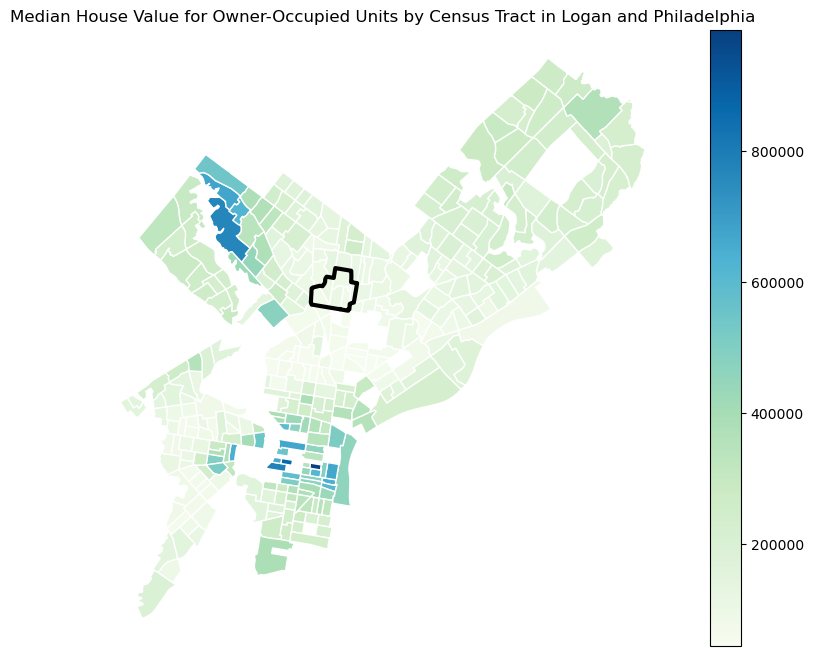

In [16]:
fig, ax = plt.subplots(figsize = (10,8)) 
pa_housing.plot(column = 'Median House Value for All Owner-Occupied Housing Units',legend=True,
  legend_kwds={'orientation': "vertical"},classification_kwds={'bins':[0.25, 0.5,0.75,1]},edgecolor='white',cmap = 'GnBu',ax=ax)
logan_boundary.geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)
ax.axis('off')
plt.title('Median House Value for Owner-Occupied Units by Census Tract in Logan and Philadelphia')

plt.savefig("Median House Values Across Philadelphia Census Tracts.png", transparent=True)

#### Affordable Housing Projects ####

The next element to look at is dedicated affordable housing investment from the Phildelphia City Government. I learned that a loy og investment was spent on demolishing units and moving people from homes that were sinking, but where is the City spending its money in a productive and constructive effort to address housing stability? 

Pulling from the Open Philly Database, I am going to read in a dataset of affordable housing developments that were funded by Division of Housing and Community Development (DHCD) and built between 1994 to August 2019. In looking at the file, there were no geographic variables. However, there are addresses that could be geocoded to be mapped. There are also no city, state, or zip code fields, so in Excel I added a variable for City and State and added Philadelphia and PA because these are all afforable housing units in Philadelphia. I then looked up units that did not have clear addresses, and for sites that had multiple addresses but in the same development, I only included one address. There is another variable for the number of total units, and I would like to show dots in various sizes the correspond to the unit total of development, *but that is a next step.*

In [17]:
dfah = pd.read_csv('data/ahclean.csv')

After reading in the new dataset, I have to get to work on getting these addresses into a mappable format. So, I import several libraries that can help me convert address data into lats and longs to map (thanks for the code @chris!). First, I need to put together the components that will make up a single address column, and then I am going to geocode to produce a lat, long to then map.


In [18]:
import geopy
dir(geopy)
from geopy.geocoders import Photon
dir(Photon)
from geopy.geocoders import Nominatim
import time
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from geopy import distance
import osmnx as ox
import contextily as ctx

In [19]:
dfah['ADDRESS2'] = dfah['ADDRESS'] + ' ' + dfah['CITY'] + ' ' + dfah['STATE']

In [20]:
dfah.sample()

,OBJECTID,FISCAL_YEAR_COMPLETE,PROJECT_NAME,DEVELOPER_NAME,ADDRESS,CITY,STATE,PROJECT_TYPE,TOTAL_UNITS,ACCESSIBLE_UNITS,SENSORY_UNITS,VISITABLE_UNITS,ADDRESS2
163,164,2007.0,Cecil B. Moore III-1,HERB CDC,1501 N UBER ST,PHILADELPHIA,PA,Homeownership,64.0,NaN,NaN,NaN,1501 N UBER ST PHILADELPHIA PA


It looks like the new address (ADDRESS2) worked! Now time to geocode these more complete addresses using ['ADDRESS2']. 

For this week, I will use one loop function here to geocode these addresses into lat, long format. 

In [21]:
for index, row in dfah.iterrows():

    address = row['ADDRESS2']
    
    try:
        
        geocoded_address = ox.geocoder.geocode(address)

        dfah.at[index,'lat']=geocoded_address[0]
        dfah.at[index,'lon']=geocoded_address[1]

        
        print(address + ' geocoded to ' + str(geocoded_address[0])+' '+str(geocoded_address[1]))        

    except:
        print('Could not geocode '+ address)
        pass

1315 N 8TH ST PHILADELPHIA PA geocoded to 39.972245 -75.14947471428572
3921 N 5TH ST PHILADELPHIA PA geocoded to 39.9614883 -75.1465345
3232 HENRY AVE PHILADELPHIA PA geocoded to 40.01024132653061 -75.1810400612245
161 W ALLEGHENY AVE PHILADELPHIA PA geocoded to 39.99902475 -75.1323775625
447 CANTRELL ST PHILADELPHIA PA geocoded to 39.92200279591837 -75.15428936734693
2000 S 58TH ST PHILADELPHIA PA geocoded to 39.934514 -75.227223
2011 N MARSHALL ST PHILADELPHIA PA geocoded to 39.981931857142854 -75.14507742857143
2601 N BROAD ST PHILADELPHIA PA geocoded to 39.99246 -75.154817
1701 S 28TH ST PHILADELPHIA PA geocoded to 39.9316908 -75.19026365765035
1702 N 52nd St PHILADELPHIA PA geocoded to 39.98063232653061 -75.2247380612245
2413 N BROAD ST PHILADELPHIA PA geocoded to 39.989901 -75.155367
1822 W TIOGA ST PHILADELPHIA PA geocoded to 40.00696802040816 -75.15873528571429
3202 MANTUA AVE PHILADELPHIA PA geocoded to 39.96590999853028 -75.18920518697685
1900 W ALLEGHENY AVE PHILADELPHIA PA 

To check the geocoding process, I use am going to see how many places mapped. I can see some locations, which included "scattered sites" housing did not provide an address, so they did not map. 

In [22]:
dfah.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401 entries, 0 to 400
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OBJECTID              401 non-null    int64  
 1   FISCAL_YEAR_COMPLETE  397 non-null    float64
 2   PROJECT_NAME          401 non-null    object 
 3   DEVELOPER_NAME        401 non-null    object 
 4   ADDRESS               401 non-null    object 
 5   CITY                  401 non-null    object 
 6   STATE                 401 non-null    object 
 7   PROJECT_TYPE          401 non-null    object 
 8   TOTAL_UNITS           398 non-null    float64
 9   ACCESSIBLE_UNITS      28 non-null     float64
 10  SENSORY_UNITS         24 non-null     float64
 11  VISITABLE_UNITS       21 non-null     float64
 12  ADDRESS2              401 non-null    object 
 13  lat                   374 non-null    float64
 14  lon                   374 non-null    float64
dtypes: float64(7), int64(1)

This clean up was successful in adding about 50 addresses to the previous midterm affordable housing map dataset with lat/long coordinates. The next step will be to convert the dataframe to a geodataframe to map! 

In [23]:
gdah = gpd.GeoDataFrame(dfah, 
                       crs='epsg:4236',
                       geometry=gpd.points_from_xy(dfah.lon, dfah.lat))

Now that these points are mapped, I am going to use code to place the points on an initial map. I am also going to try to make this pretty using teal which is from our palette and a basic minimal base Stamen TonerLite. I am taking Yoh's advice to use 3857 vs. 4236, so I added in code to change the projection. I also continued to include the Logan boundary.

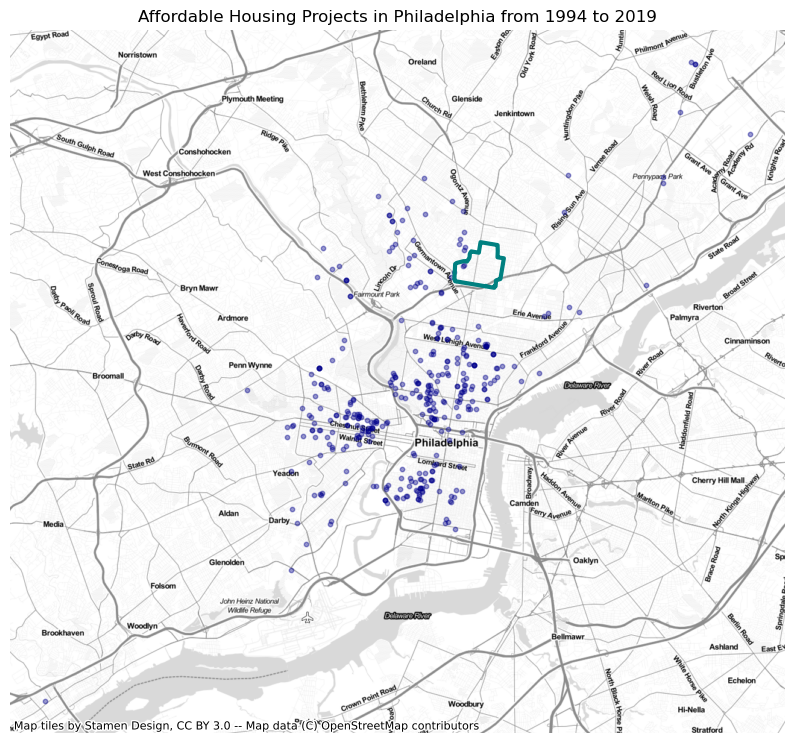

In [24]:
fig, ax = plt.subplots(figsize=(10,10))

gdah.to_crs(3857).plot(ax=ax, 
        marker='o',
        markersize=10,
        alpha=0.4,
        color='darkblue')

ax.axis('off')


ax.set_title('Affordable Housing Projects in Philadelphia from 1994 to 2019')

logan_boundary.to_crs(3857).geometry.boundary.plot(color=None,edgecolor='teal',linewidth = 3,ax=ax)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=3857)
plt.savefig("affordablehousingprojects.png", transparent=True)

I also want to explore the projects to find additional details on them, so I am going to map these places on a folium map. So, I will need to make sure they are all geolocated and ready to be read in. I am going to set up a loop to start mapping my markers for each housing project. I will then drop rows that do not have values and create a new dataset.

In [25]:
gdah2=gdah.dropna(subset=['lon'])
gdah2=gdah.dropna(subset=['lat'])

In [26]:
gdah2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 374 entries, 0 to 400
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   OBJECTID              374 non-null    int64   
 1   FISCAL_YEAR_COMPLETE  370 non-null    float64 
 2   PROJECT_NAME          374 non-null    object  
 3   DEVELOPER_NAME        374 non-null    object  
 4   ADDRESS               374 non-null    object  
 5   CITY                  374 non-null    object  
 6   STATE                 374 non-null    object  
 7   PROJECT_TYPE          374 non-null    object  
 8   TOTAL_UNITS           372 non-null    float64 
 9   ACCESSIBLE_UNITS      28 non-null     float64 
 10  SENSORY_UNITS         24 non-null     float64 
 11  VISITABLE_UNITS       21 non-null     float64 
 12  ADDRESS2              374 non-null    object  
 13  lat                   374 non-null    float64 
 14  lon                   374 non-null    float64 
 15

Nice! So, again that cleaning results in 374 projects mapped. I am going to again, return to the data I included above on median home values and overlay the housing investments using folium. 

In [27]:
m = folium.Map(location=[+39.99, -75.1652], 
               zoom_start = 12,
               tiles='Stamen Toner', 
               attribution='Stamen Toner')


folium.Choropleth(
                  geo_data=pa_housing, # geo data
                  data=pa_housing, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'Median House Value for All Owner-Occupied Housing Units'], # [key, value]
                  fill_color='GnBu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Home Values in Philadelphia (2021)').add_to(m)    # name on the legend color bar
m

Now, I want to overlay to layer the affordable housing development sites over the home values. I again, am going to use a loop to add a circle marker for each address. 

In [28]:
for index, row in gdah2.iterrows():
 
    folium.CircleMarker([row.lat, row.lon], popup=row.PROJECT_NAME,color='darkgreen',fill_color='darkgreen',radius=3,weight=1).add_to(m)

m

In [29]:
m.save('index.html')

Based on this map above, there are very few housing investments in the Logan Neighborhood area. There are fewer investments north of Erie Avenue and West of Broad Street. I am curious about these specific project types. 

#### Development Types ####

An interesting thing about the data from Philly is that it seems like they have affordable housing homeowner models, which is not usually the case in the US. I am going to make a quick bar chart of what types of housing projects these are and see if I can make three maps with the different data. Although there are some projects that I have the type data for but NOT the complete address data, I am going to just map projects with more complete data.

In [30]:
gdah2.value_counts('PROJECT_TYPE')

PROJECT_TYPE
Rental           169
Special Needs    109
Homeownership     96
dtype: int64

I made a new variable for project count and will generate different maps based on these three different counts.

In [31]:
project_count = gdah2['PROJECT_TYPE'].value_counts()
project_count

Rental           169
Special Needs    109
Homeownership     96
Name: PROJECT_TYPE, dtype: int64

In my bar graph, I want to use the same color scheme as my maps and remove some of the more distracting features.

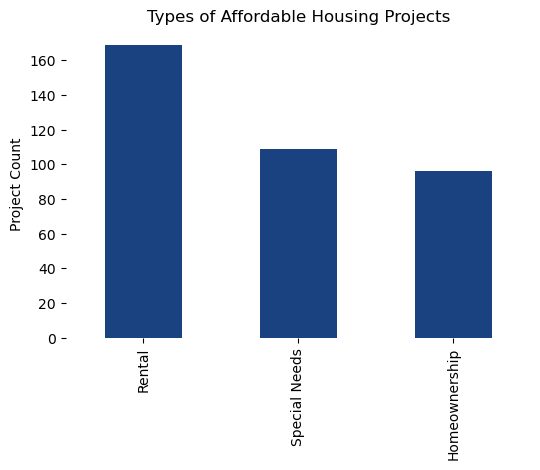

In [32]:
fig, ax = plt.subplots(figsize=(6,4))

for spine in plt.gca().spines.values():
    spine.set_visible(False)

project_count.plot.bar(ax=ax,
                                      x='PROJECT_TYPE',
                                      y='project_count',
                                      legend=False,
                                      color='#1a4280ff',
                                       )
                                      
ax.set_ylabel('Project Count') # override y label
plt.title("Types of Affordable Housing Projects"); # multi-line title with padding

Now I am going to try to make a map that includes data for the three types of projects with a color code for each of the three projects. I chose a different color for each and I am going to overlay them on the static affordable housing project map by color.

In [33]:
gdah2.loc[gdah2['PROJECT_TYPE'] == 'Rental', 'color'] = 'mediumaquamarine'
gdah2.loc[gdah2['PROJECT_TYPE'] == 'Special Needs', 'color'] = 'cornflowerblue'
gdah2.loc[gdah2['PROJECT_TYPE'] == 'Homeownership', 'color'] = 'navy'

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [34]:
gdah2.sample(5)

,OBJECTID,FISCAL_YEAR_COMPLETE,PROJECT_NAME,DEVELOPER_NAME,ADDRESS,CITY,STATE,PROJECT_TYPE,TOTAL_UNITS,ACCESSIBLE_UNITS,SENSORY_UNITS,VISITABLE_UNITS,ADDRESS2,lat,lon,geometry,color
65,66,2013.0,Sojourner House,Women Against Abuse,6027 GERMANTOWN AVE,PHILADELPHIA,PA,Special Needs,15.0,NaN,NaN,NaN,6027 GERMANTOWN AVE PHILADELPHIA PA,40.053486,-75.186248,POINT (-75.18625 40.05349),cornflowerblue
344,345,1998.0,Jameson Court,West Mill Creek Associates II,4435 PARRISH ST,PHILADELPHIA,PA,Rental,72.0,NaN,NaN,NaN,4435 PARRISH ST PHILADELPHIA PA,39.967889,-75.212173,POINT (-75.21217 39.96789),mediumaquamarine
308,309,2001.0,Villa III,Nueva Esperanza,1322 N HANCOCK ST,PHILADELPHIA,PA,Homeownership,7.0,NaN,NaN,NaN,1322 N HANCOCK ST PHILADELPHIA PA,39.971203,-75.138199,POINT (-75.13820 39.97120),navy
276,277,2002.0,Homestart Susquehanna,PHDC,1626 FRENCH ST,PHILADELPHIA,PA,Homeownership,7.0,NaN,NaN,NaN,1626 FRENCH ST PHILADELPHIA PA,39.986204,-75.160088,POINT (-75.16009 39.98620),navy
320,321,2000.0,Taino Gardens,APM,2200 N 6TH ST,PHILADELPHIA,PA,Rental,42.0,NaN,NaN,NaN,2200 N 6TH ST PHILADELPHIA PA,39.984818,-75.143924,POINT (-75.14392 39.98482),mediumaquamarine


Now that the color addition works, I am going to make out the projects by color and overlay the map of Logan. I am also going to create a custom legend with the three different colors for the three housing project types: rental, special needs, homeownership. 

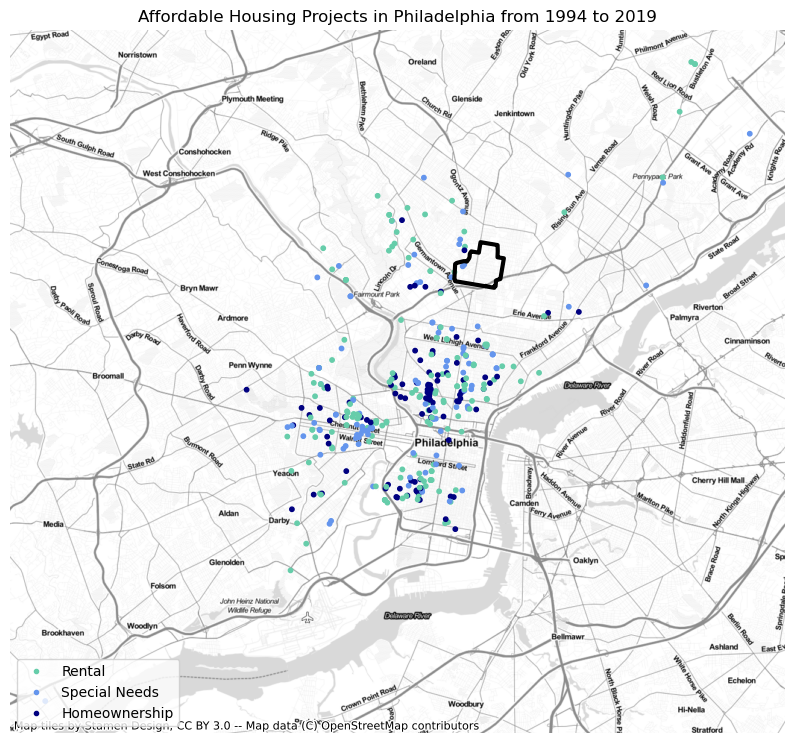

In [35]:
fig, ax = plt.subplots(figsize=(10,10))

gdah2.to_crs(3857).plot(ax=ax, 
        marker='o',
        markersize=10,
        color = gdah2.color)


# build custom legend
legend_elements1 = [
    ## add the center node to the legend
   Line2D([0], [0], marker='.', color='mediumaquamarine', linestyle='',label='Rental', markersize=6),
   Line2D([0], [0], marker='.', color='cornflowerblue', linestyle='',label='Special Needs', markersize=6),
   Line2D([0], [0], marker='.', color='navy', linestyle='',label='Homeownership', markersize=6)
    ]

# add the legend
ax.legend(handles=legend_elements1,loc='lower left') # location options: upper/center/lower and left/center/right

ax.axis('off')
ax.set_title('Affordable Housing Projects in Philadelphia from 1994 to 2019')

logan_boundary.to_crs(3857).geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=3857)
plt.savefig("affordablehousingprojectstype.png", transparent=True)

I wanted to also try to use a loop to describe what type of project each development.

def project_map(type):
  print(type + " is a "+gdah2.PROJECT_TYP)

project_map(gdah2.PROJECT_NAME)


This loop identifies a specific project and what its particular color on the map is. Next would be to incorporate this into a legend. 

#### Neighborhood Resources

I also want to take a look at the investment in neighborhood resources, specifically by mapping the neighborhood resource centers from the OpenDataPhilly. I am reading in this point data and will follow the same processes that I have used for the affordable housing sites. 

In [36]:
dfresource = pd.read_csv('data/neighborhoodresources.csv')

I am going to map all these neighborhood resources and use a light color and transparency and include the Logan boundary on the map. 

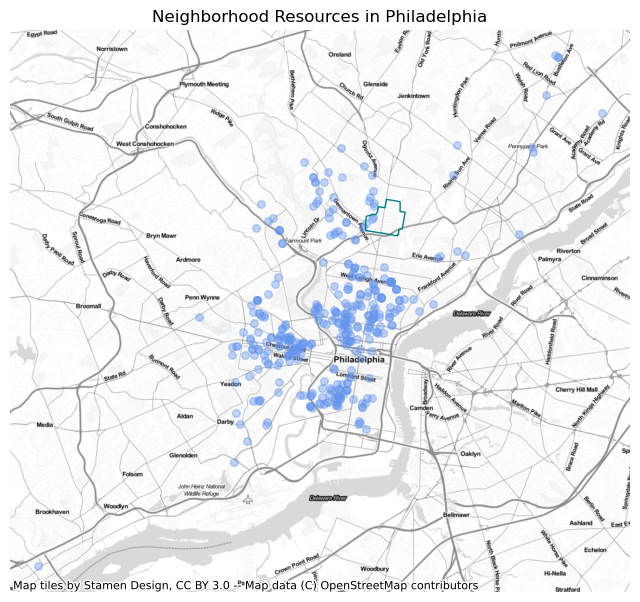

In [37]:
fig, ax = plt.subplots(figsize=(8,10))

gdah.to_crs(3857).plot(ax=ax, 
        marker='o',
        markersize=30,
        color='cornflowerblue',
        alpha=0.4)

ax.axis('off')


ax.set_title('Neighborhood Resources in Philadelphia')

logan_boundary.to_crs(3857).geometry.boundary.plot(color=None,edgecolor='teal',linewidth = 1,ax=ax)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=3857)
plt.savefig("phillyneighborhoodresources.png", transparent=True)

I also want to put these resource centers on a folium map to be able to see more clearly and with labels. First, I am going to project into the correct projection. 

In [38]:
gdfresource = gpd.GeoDataFrame(dfresource, 
                       crs='epsg:3857',
                       geometry=gpd.points_from_xy(dfresource.X, dfresource.Y))

Now, I drop all the locations that are missing one of their coordinates and not possible to be mapped. 

In [39]:
gdfresource2=gdfresource.dropna(subset=['X'])
gdfresource2=gdfresource.dropna(subset=['Y'])

Let's look at what is left-- 43 entries with full locational data. 

In [40]:
gdfresource2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 43 entries, 0 to 42
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   X                43 non-null     float64 
 1   Y                43 non-null     float64 
 2   OBJECTID         43 non-null     int64   
 3   AGENCY           43 non-null     object  
 4   STREET_ADDRESS   43 non-null     object  
 5   ZIP_CODE         43 non-null     int64   
 6   PHONE_NUMBER     43 non-null     object  
 7   WEBSITE_URL      42 non-null     object  
 8   FORECLOSURE      27 non-null     object  
 9   PRE_PURCHASE     28 non-null     object  
 10  SPECIALTY        24 non-null     object  
 11  NAC_COORDINATOR  20 non-null     object  
 12  EMAIL_ADDRESS    20 non-null     object  
 13  NAC              20 non-null     object  
 14  NEC              16 non-null     object  
 15  HCA              27 non-null     object  
 16  geometry         43 non-null     geome

I am now going to create the folium map with the same Stamen Toner base file. 

In [41]:
m = folium.Map(location=[+39.99, -75.1652], 
               zoom_start = 11,
               tiles='Stamen Toner', 
               attribution='Stamen Toner')

m

In [42]:
m = folium.Map(location=[+39.99, -75.1652], 
               zoom_start = 11,
               tiles='Stamen Toner', 
               attribution='Stamen Toner')


for index, row in gdfresource2.iterrows():
 
    folium.CircleMarker([row.Y, row.X], popup=row.AGENCY,color='teal',fill_color='green',radius=3,weight=3).add_to(m)
m


In [43]:
m.save('resourcecenters.html')

#### Environmental Justice 

These were really helpful initial steps to understanding the housing situation at a very high level in Philadelphia and Logan. However, we wanted to get a sense of how housing intersects with environmental justice. One of the ways to do that is through environmental justice data, like the data that makes up CalEnviroScreen. I accessed federal data files from the EPA that include environmental justice indicators, but they needed to be filtered down to the tract level to not crash Jupyter Hub. I am going to read in and start to clean the EJ dataset. 

In [44]:
ejphilly = pd.read_csv(
    'data/ejdataphilly.csv',
    dtype=
    { 
        'ID':str
    }
)


In [45]:
ejphilly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 408 entries, 0 to 407
Columns: 157 entries, Unnamed: 0 to FIPS
dtypes: float64(117), int64(4), object(36)
memory usage: 500.6+ KB


The varible for FIPS is ID in the dataset, so I will change the name. 

In [46]:
ejphilly['FIPS']=ejphilly['ID']
ejphilly['FIPS']

0      42101000101
1      42101000102
2      42101000200
3      42101000300
4      42101000401
          ...     
403    42101980905
404    42101980906
405    42101989100
406    42101989200
407    42101989300
Name: FIPS, Length: 408, dtype: object

Now, I am going to merge this administrative data onto the specific geographic data for Philadelphia census tracts. 

In [47]:
pa_ej= tracts.merge(ejphilly,on='FIPS')

I am now going to make a chloropleth map with our Philadelphia color scheme and an outline of the boundary that makes up the Logan tracts. The data that will be mapped is housing built before 1960. This indicator is a proxy for lead paint. Becuase prior to 1960, lead paint was used in housing, and paint is a major source of exposure to lead. 

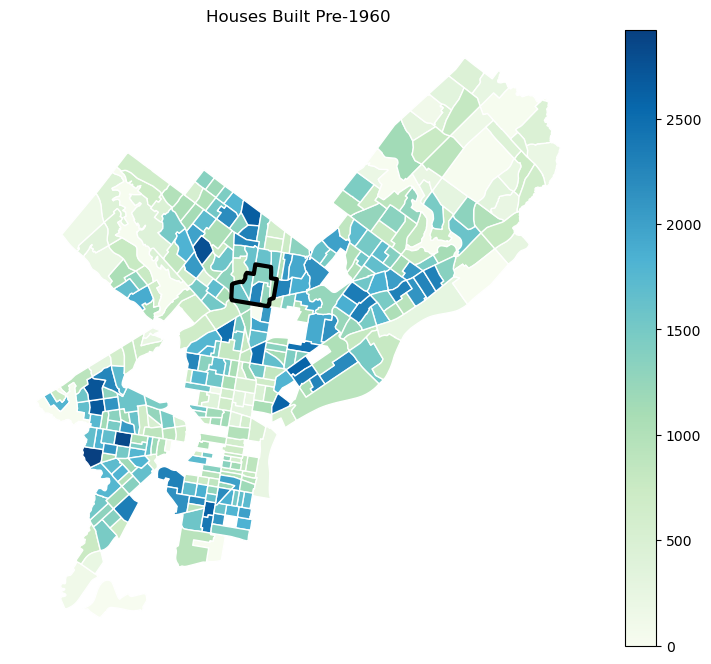

In [48]:
fig, ax = plt.subplots(figsize = (10,8)) 
pa_ej.plot(column = 'PRE1960',legend=True,
  legend_kwds={'orientation': "vertical"},classification_kwds={'bins':[0.25, 0.5,0.75,1]},edgecolor='white',cmap = 'GnBu',ax=ax)
logan_boundary.geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)
ax.axis('off')
plt.title('Houses Built Pre-1960')

plt.savefig("Median House Values Across Philadelphia Census Tracts.png", transparent=True)

I am now going to make a chloropleth map with our Philadelphia color scheme and an outline of the boundary that makes up the Logan tracts. The data that will be mapped is THE PERCENT of housing built before 1960. This indicator is a proxy for lead paint. Becuase prior to 1960, lead paint was used in housing, and paint is a major source of exposure to lead. 

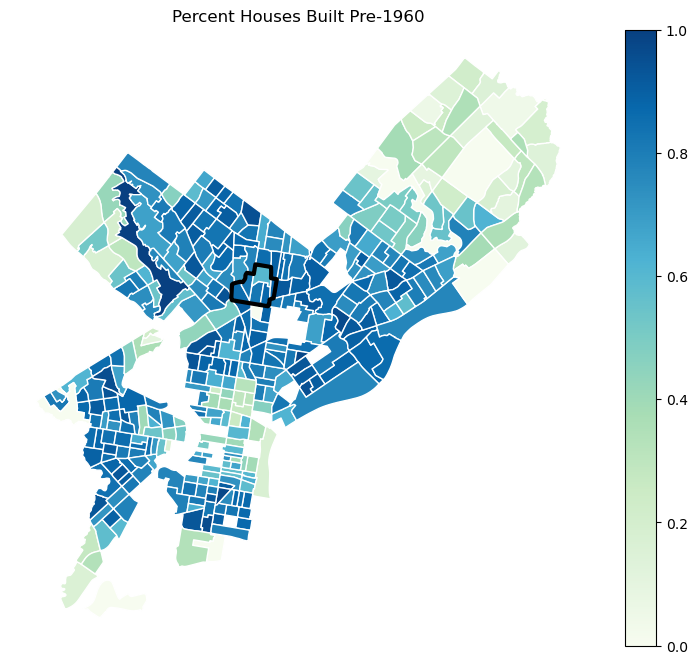

In [49]:
fig, ax = plt.subplots(figsize = (10,8)) 
pa_ej.plot(column = 'PRE1960PCT',legend=True,
  legend_kwds={'orientation': "vertical"},classification_kwds={'bins':[0.25, 0.5,0.75,1]},edgecolor='white',cmap = 'GnBu',ax=ax)
logan_boundary.geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)
ax.axis('off')
plt.title('Percent Houses Built Pre-1960')
plt.savefig("Percent Houses Built Pre-1960.png", transparent=True)

I am now going to make a chloropleth map with our Philadelphia color scheme and an outline of the boundary that makes up the Logan tracts. The data that will be mapped is THE PERCENT of housing with lead paint.

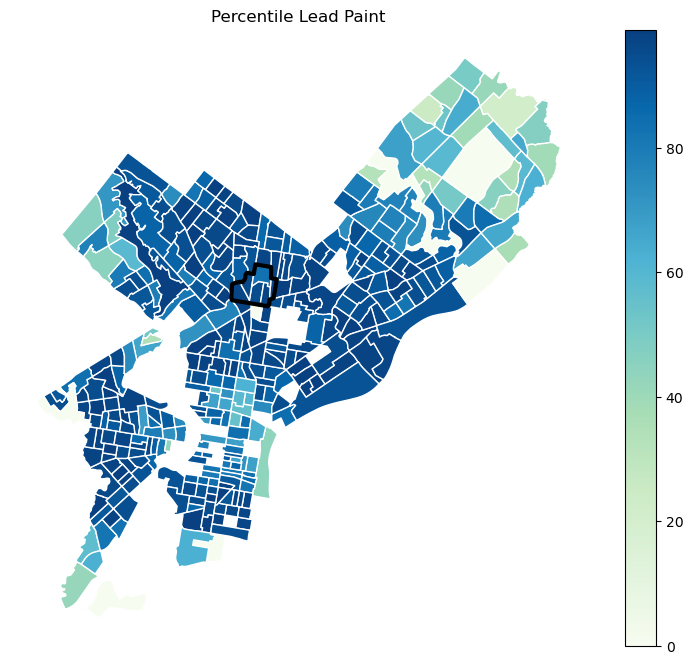

In [50]:
fig, ax = plt.subplots(figsize = (10,8)) 
pa_ej.plot(column = 'P_LDPNT',legend=True,
  legend_kwds={'orientation': "vertical"},classification_kwds={'bins':[0.25, 0.5,0.75,1]},edgecolor='white',cmap = 'GnBu',ax=ax)
logan_boundary.geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)
ax.axis('off')
plt.title('Percentile Lead Paint')
plt.savefig("Percentile Lead Paint.png", transparent=True)

I am going to make the same map for the percentage of racial minorities, which is another environmental injustice indicator because of the legacies of racism. 

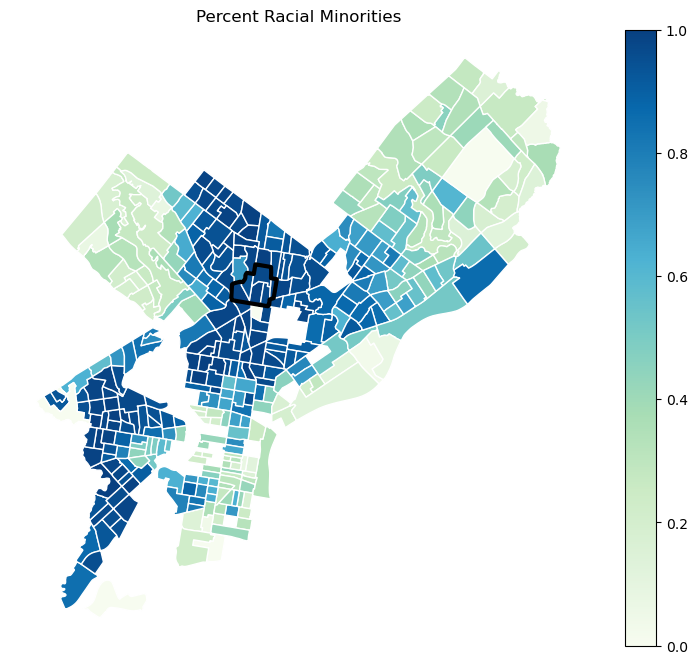

In [51]:
fig, ax = plt.subplots(figsize = (10,8)) 
pa_ej.plot(column = 'MINORPCT',legend=True,
  legend_kwds={'orientation': "vertical"},classification_kwds={'bins':[0.25, 0.5,0.75,1]},edgecolor='white',cmap = 'GnBu',ax=ax)
logan_boundary.geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)
ax.axis('off')
plt.title('Percent Racial Minorities')
plt.savefig("Percent Racial Minorities.png", transparent=True)

I also want to get a sense of the the percentage of homes built before a specific year. I picked the earliest time period included in the 2017-2021 5-year ACS (before 1939). I created percentages for housing built and wanted to map Percent Housing Units Before 1939. 

In [52]:
pa_housing['pct_housingage'] =pa_housing['Occupied Housing Units']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing2020'] =pa_housing['Occupied Housing Units: Built 2020 or Later']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing2010']=pa_housing['Occupied Housing Units: Built 2010 to 2019']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing2000']=pa_housing['Occupied Housing Units: Built 2000 to 2009']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing1990']=pa_housing['Occupied Housing Units: Built 1990 to 1999']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing1980']=pa_housing['Occupied Housing Units: Built 1980 to 1989']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing1970']=pa_housing['Occupied Housing Units: Built 1970 to 1979']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing1960']=pa_housing['Occupied Housing Units: Built 1960 to 1969']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing1950']=pa_housing['Occupied Housing Units: Built 1950 to 1959']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing1940']=pa_housing['Occupied Housing Units: Built 1940 to 1949']/pa_housing['Occupied Housing Units']*100
pa_housing['pct_housing1939']=pa_housing['Occupied Housing Units: Built 1939 or Earlier']/pa_housing['Occupied Housing Units']*100


Using the same parameters for consistency that I have used in all my chloropleth static maps, I mapped the percent of housing units built before 1939 by census tract.

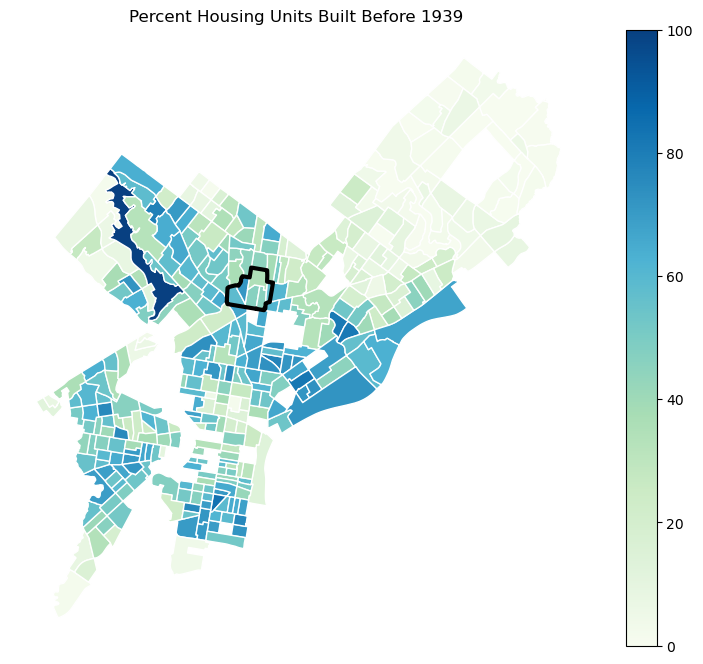

In [53]:
fig, ax = plt.subplots(figsize = (10,8)) 
pa_housing.plot(column = 'pct_housing1939',legend=True,
  legend_kwds={'orientation': "vertical"},classification_kwds={'bins':[0.25, 0.5,0.75,1]},edgecolor='white',cmap = 'GnBu',ax=ax)
logan_boundary.geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)
ax.axis('off')
plt.title('Percent Housing Units Built Before 1939 ')
plt.savefig("Percent Houses Built Before 1939.png", transparent=True)

### Mapping LandCare Sites ###

One of the other point datasets available is a map of the Philadelphia LandCare, which is a program that furthers the conversion of vacant land held by both public and private entities into community beneficial sites. Here is more background on the [program](https://phsonline.org/programs/transforming-vacant-land). First I am going to read in the data and take a look at the initial structure by looking at the first few rows and the overall content of the file (variables) with the info function. 

In [54]:
dflandcare = pd.read_csv('data/communitylandcare.csv')

In [55]:
dflandcare.head()

,OBJECTID_1,OBJECTID,PARCELID,TENCODE,ADDRESS,OWNER1,OWNER2,BLDG_CODE,BLDG_DESC,BRT_ID,NUM_BRT,NUM_ACCOUN,GROSS_AREA,PARCELSNUM,COMM_PARTN,Shape__Area,Shape__Length
0,36,56757,57990,8832001316,1316 N 27TH ST,PHILADELPHIA LAND BANK,,SR,VAC LAND RES < ACRE,292058010,1,1,1040,1,BSCCA,1034.994141,170.178609
1,37,71188,72745,8832001318,1318 N 27TH ST,PHILADELPHIA LAND BANK,,SR,VAC LAND RES < ACRE,292058110,1,1,345,1,BSCCA,345.443970,114.532137
2,38,66101,67542,6212002640,2640 W OXFORD ST,RF EDGE III LLC,,SR,VAC LAND RES < ACRE,291222800,1,1,810,1,BSCCA,810.009033,138.000070
3,39,93020,94976,8832001539,1539 N 27TH ST,DOCK MONUMENT LLC,,H30,SEMI DET 2 STY MASONRY,291381400,1,1,770,1,BSCCA,760.700439,142.986818
4,40,94230,96210,8836001311,1311 N 29TH ST,RAZA HOMES LLC,,SR,VAC LAND RES < ACRE,292152810,1,1,1024,1,BSCCA,1021.831177,160.182585


In [56]:
dflandcare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2263 entries, 0 to 2262
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   OBJECTID_1     2263 non-null   int64  
 1   OBJECTID       2263 non-null   int64  
 2   PARCELID       2263 non-null   int64  
 3   TENCODE        2263 non-null   object 
 4   ADDRESS        2263 non-null   object 
 5   OWNER1         2263 non-null   object 
 6   OWNER2         2263 non-null   object 
 7   BLDG_CODE      2263 non-null   object 
 8   BLDG_DESC      2263 non-null   object 
 9   BRT_ID         2263 non-null   object 
 10  NUM_BRT        2263 non-null   int64  
 11  NUM_ACCOUN     2263 non-null   int64  
 12  GROSS_AREA     2263 non-null   int64  
 13  PARCELSNUM     2263 non-null   int64  
 14  COMM_PARTN     2263 non-null   object 
 15  Shape__Area    2263 non-null   float64
 16  Shape__Length  2263 non-null   float64
dtypes: float64(2), int64(7), object(8)
memory usage: 300

After my initial read in, I saw that just like the other Philadelphia DHCD file, the addresses did not include City or State, so when initially mapped, they came up all over the country. I downloaded the CSV and added Philadelphia as a CITY variable and Pennsylvania as a STATE variable and double checked these sites. There are over 2,200 projects, but the data will be helpful, especially because it shows the owner and includes the Phildelphia Land Bank. So, the edited file is read in now. I also wanted to look at who owned the sites, so I made sure that the ownership information was complete to be able to chart out the ownership breakdown. 

In [57]:
dflandcare_clean = pd.read_csv('data/communitylandcareown.csv')

Similar to the affordable housing data, I needed to create a new clean address that includes the manually added city and state into a new variable to be prepared for geocoding. 

In [58]:
dflandcare_clean['ADDRESS2'] = dflandcare_clean['ADDRESS'] + ' ' + dflandcare_clean['CITY'] + ' ' + dflandcare_clean['STATE']

Let's see if it worked!

In [59]:
dflandcare_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2262 entries, 0 to 2261
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   OBJECTID_1     2262 non-null   int64  
 1   OBJECTID       2262 non-null   int64  
 2   PARCELID       2262 non-null   int64  
 3   TENCODE        2262 non-null   int64  
 4   ADDRESS        2262 non-null   object 
 5   CITY           2262 non-null   object 
 6   STATE          2262 non-null   object 
 7   OWNER1         2262 non-null   object 
 8   OWNER2         669 non-null    object 
 9   BLDG_CODE      2262 non-null   object 
 10  BLDG_DESC      2262 non-null   object 
 11  BRT_ID         2262 non-null   int64  
 12  NUM_BRT        2262 non-null   int64  
 13  NUM_ACCOUN     2262 non-null   int64  
 14  GROSS_AREA     2262 non-null   int64  
 15  PARCELSNUM     2262 non-null   int64  
 16  COMM_PARTN     2262 non-null   object 
 17  Shape__Area    2262 non-null   float64
 18  Shape__L

Now, I am going to re-run the geocoding loop to be able to map the nearly 2,200 landcare sites across Philadelphia. This code takes the address and gives it a lat and long to be mapped spatially. 

In [60]:
for index, row in dflandcare_clean.iterrows():

    address = row['ADDRESS2']
    
    try:
        
        geocoded_address = ox.geocoder.geocode(address)

        dflandcare_clean.at[index,'lat']=geocoded_address[0]
        dflandcare_clean.at[index,'lon']=geocoded_address[1]

        
        print(address + ' geocoded to ' + str(geocoded_address[0])+' '+str(geocoded_address[1]))        

    except:
        print('Could not geocode '+ address)
        pass

1316 N 27TH ST Philadelphia PA geocoded to 39.97619567346939 -75.18009930612246
1318 N 27TH ST Philadelphia PA geocoded to 39.976213632653064 -75.18009546938777
2640 W OXFORD ST Philadelphia PA geocoded to 39.97983517948718 -75.1786745897436
1539 N 27TH ST Philadelphia PA geocoded to 39.97912504081633 -75.17925034693877
1311 N 29TH ST Philadelphia PA geocoded to 39.976521676992704 -75.18294716340881
2705 JEFFERSON ST Philadelphia PA geocoded to 39.9786604 -75.1796408
2509 MASTER ST Philadelphia PA geocoded to 39.972957 -75.237983
2730 MASTER ST Philadelphia PA geocoded to 39.972957 -75.237983
2912 MASTER ST Philadelphia PA geocoded to 39.972957 -75.237983
1462 N MYRTLEWOOD ST Philadelphia PA geocoded to 39.978561469387756 -75.18380410204081
1455 N MYRTLEWOOD ST Philadelphia PA geocoded to 39.97844279591837 -75.18361334693878
1326 N MYRTLEWOOD ST Philadelphia PA geocoded to 39.97685952501433 -75.18419488221043
1334 N MYRTLEWOOD ST Philadelphia PA geocoded to 39.97694310750349 -75.184176

In [61]:
gdflandcare_clean = gpd.GeoDataFrame(dflandcare_clean, 
                       crs='epsg:4236',
                       geometry=gpd.points_from_xy(dflandcare_clean.lon, dflandcare_clean.lat))

In [62]:
gdflandcare_clean.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2262 entries, 0 to 2261
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   OBJECTID_1     2262 non-null   int64   
 1   OBJECTID       2262 non-null   int64   
 2   PARCELID       2262 non-null   int64   
 3   TENCODE        2262 non-null   int64   
 4   ADDRESS        2262 non-null   object  
 5   CITY           2262 non-null   object  
 6   STATE          2262 non-null   object  
 7   OWNER1         2262 non-null   object  
 8   OWNER2         669 non-null    object  
 9   BLDG_CODE      2262 non-null   object  
 10  BLDG_DESC      2262 non-null   object  
 11  BRT_ID         2262 non-null   int64   
 12  NUM_BRT        2262 non-null   int64   
 13  NUM_ACCOUN     2262 non-null   int64   
 14  GROSS_AREA     2262 non-null   int64   
 15  PARCELSNUM     2262 non-null   int64   
 16  COMM_PARTN     2262 non-null   object  
 17  Shape__Area    2262 non-n

It worked! But I realized in looking over the geocoding that there are several locations that could not be mapped. Here I drop values that could not be geocoded to make it easier to map. I made a new dataset, so I could keep the full set for other analysis. 

In [63]:
gdflandcare_cleanfull = gdflandcare_clean.dropna(subset=['lat','lon'])


Did it work? Let's take a look at how many observations there are. 

In [64]:
gdflandcare_cleanfull.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2228 entries, 0 to 2261
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   OBJECTID_1     2228 non-null   int64   
 1   OBJECTID       2228 non-null   int64   
 2   PARCELID       2228 non-null   int64   
 3   TENCODE        2228 non-null   int64   
 4   ADDRESS        2228 non-null   object  
 5   CITY           2228 non-null   object  
 6   STATE          2228 non-null   object  
 7   OWNER1         2228 non-null   object  
 8   OWNER2         659 non-null    object  
 9   BLDG_CODE      2228 non-null   object  
 10  BLDG_DESC      2228 non-null   object  
 11  BRT_ID         2228 non-null   int64   
 12  NUM_BRT        2228 non-null   int64   
 13  NUM_ACCOUN     2228 non-null   int64   
 14  GROSS_AREA     2228 non-null   int64   
 15  PARCELSNUM     2228 non-null   int64   
 16  COMM_PARTN     2228 non-null   object  
 17  Shape__Area    2228 non-n

And again, let's see how it all looks! I am again, going to map out these locations on a static map with some transparency to see overlap more clearly. I am also going to overlay the logan boundary again to see how many of these sites are within our area. 

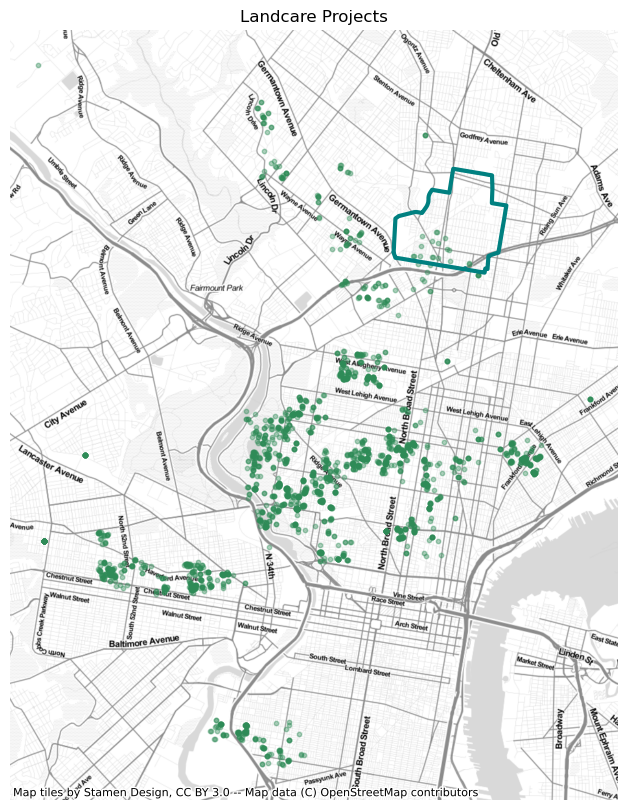

In [65]:
fig, ax = plt.subplots(figsize=(10,10))

gdflandcare_cleanfull.to_crs(3857).plot(ax=ax, 
        marker='o',
        markersize=10,
        alpha =0.4,
        color='seagreen')

ax.axis('off')


ax.set_title('Landcare Projects')

logan_boundary.to_crs(3857).geometry.boundary.plot(color=None,edgecolor='teal',linewidth = 3,ax=ax)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=3857)
plt.savefig("landcare.png", transparent=True)

As I would hope, there are some properties in the southern portion of Logan, adjacent to the Logan Triangle, where I know there are a lot of vacant lots. I want to see what these specific addresses are to get a sense of what a landcare site would include. So, I am going to use the same process as above to make a folium map. 

In [66]:
m = folium.Map(location=[+40.02456, -75.141496],
               zoom_start = 14,
               tiles='Stamen Toner', 
               attribution='Stamen Toner')
m

In [67]:
for index, row in gdflandcare_cleanfull.iterrows():
 
    folium.CircleMarker([row.lat, row.lon], popup=row.ADDRESS,color='seagreen',fill_color='seagreen',radius=5,weight=1.5).add_to(m)
m

I am also interested in who owns these sites. If we are asking the government to make investments in neighborhood revitalization, it would make sense that they need to own or have the ability to transform these sites. I am going to do a value count to see who owns the most properties and if there are any ownership patterns. 

In [68]:
gdflandcare_cleanfull.value_counts('OWNER1')

OWNER1
CITY OF PHILADELPHIA        311
PHILA HOUSING AUTHORITY     148
REDEVELOPMENT AUTHORITY     138
PHILADELPHIA LAND BANK       54
PHILADELPHIA HOUSING         13
                           ... 
GOLD NATHAN                   1
GOLD AL                       1
GNR MERAV 2 LLC               1
GLOVER LAKEIA                 1
ZION INVESTMENTS COMPANY      1
Length: 1305, dtype: int64

Interesting, so the big landowners are City agencies. Let's make a new variable so we can make some charts with these landowners!

In [69]:
landowner_count = gdflandcare_cleanfull['OWNER1'].value_counts()
landowner_count

CITY OF PHILADELPHIA       311
PHILA HOUSING AUTHORITY    148
REDEVELOPMENT AUTHORITY    138
PHILADELPHIA LAND BANK      54
PHILADELPHIA HOUSING        13
                          ... 
HERMAN STITH                 1
GRAHAM-FAISON MICHELLE       1
HARRIS KEITH S               1
MILLIGAN ANTHONY R           1
BERNARD DRESHER              1
Name: OWNER1, Length: 1305, dtype: int64

Now that we have a land owner variable that includes the counts by land owner, let's make a bar chart to see, visually, what the difference between top 10 owners is. I have included code that only segments the top 10 landowners and maps them out. 

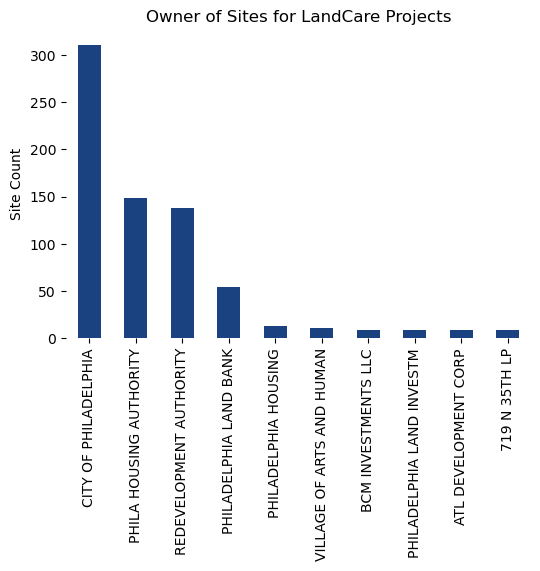

In [70]:
fig, ax = plt.subplots(figsize=(6,4))

for spine in plt.gca().spines.values():
    spine.set_visible(False)

landowner_count[:10].plot.bar(ax=ax,
                                      x='OWNER1',
                                      y='landowner_count',
                                      legend=False,
                                      color='#1a4280ff',
                                       )
                                      
ax.set_ylabel('Site Count') # override y label
plt.title("Owner of Sites for LandCare Projects"); # multi-line title with padding

I want to be able to write out the percentage of sites owned by City agencies, so let's add up (from landowner count above) the total number of properties owned by the government agencies and then multiply by 100 to get the percentage. 

In [71]:
((312+148+138+54+13)/1305)*100

50.95785440613027

!!! The City owns over half of the properties that are part of the program. No surprise, but it is still good to see that the City didn't just pay for the demolition of sites but is investing in their rebeautification and maintainence. Let me save this for any future mapping/overlaying. 

In [72]:
gdflandcare_cleanfull.to_csv('landcaresitesclean.csv', index=False)


### Redlining Data ###

I am experimenting with redlining data pulled from Mapping Inequality, a project at the University of Richmond. I downloaded a geojson file for Philadelphia. . Here is the citation for this dataset: Robert K. Nelson, LaDale Winling, Richard Marciano, Nathan Connolly, et al., “Mapping Inequality,” American Panorama, ed. Robert K. Nelson and Edward L. Ayers, accessed March 18, 2023, https://dsl.richmond.edu/panorama/redlining/[YOUR VIEW].

In [73]:
redline=gpd.read_file('data/philadelphia1937.geojson')
redline.head()

,name,holc_id,holc_grade,area_description_data,geometry
0,None,A1,A,"{'1': 'Sub Phila A 1', '2': 'Rolling', '3': 'H...","MULTIPOLYGON (((-75.12338 40.11229, -75.12205 ..."
1,None,A2,A,"{'1': 'Sub. Phila. Elkins Park A 2', '2': 'Rol...","MULTIPOLYGON (((-75.12882 40.07555, -75.12768 ..."
2,None,A3,A,"{'1': 'Philadelphia A 3', '2': 'Rolling-level'...","MULTIPOLYGON (((-75.17329 40.06201, -75.17572 ..."
3,None,A4,A,"{'1': 'Philadelphia A 4', '2': 'Rolling', '3':...","MULTIPOLYGON (((-75.19831 40.05021, -75.19899 ..."
4,None,A5,A,"{'1': 'Philadelphia A 5', '2': 'Rolling', '3':...","MULTIPOLYGON (((-75.12810 40.04734, -75.12844 ..."


When looking at the data, I see that there holc_grade is what designates a neighborhood as desirable and set the standard for racialized home lending. I want to see this spead across Phildelphia. 

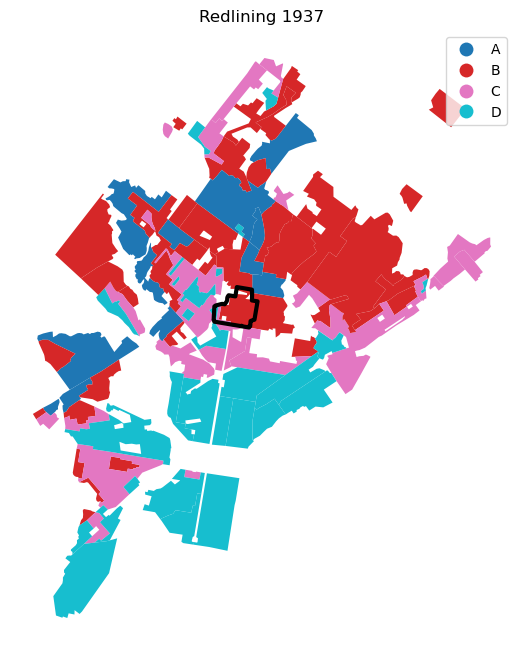

In [74]:
fig, ax = plt.subplots(figsize = (10,8)) 
redline.plot(column = 'holc_grade', legend=True, ax=ax)
    #legend_kwds={'orientation': "vertical"},classification_kwds={'bins':[0.25, 0.5,0.75,1]},edgecolor='white',cmap = 'GnBu',ax=ax)
logan_boundary.geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)
ax.axis('off')
plt.title('Redlining 1937')

plt.savefig("Redlining 1937.png", transparent=True)

However, these colors do not represent the historic way that these maps were represented. In fact the color red for "undesirable" neighborhoods is what has given these maps their name. So, I changed the colors for each grade to match their grade.

In [75]:
redline.loc[redline['holc_grade'] == 'A', 'color'] = 'yellowgreen'
redline.loc[redline['holc_grade'] == 'B', 'color'] = 'cornflowerblue'
redline.loc[redline['holc_grade'] == 'C', 'color'] = 'yellow'
redline.loc[redline['holc_grade'] == 'D', 'color'] = 'tomato'

I then mapped these areas to see the designation of each neighborhood and the logan boundary overlaid. 

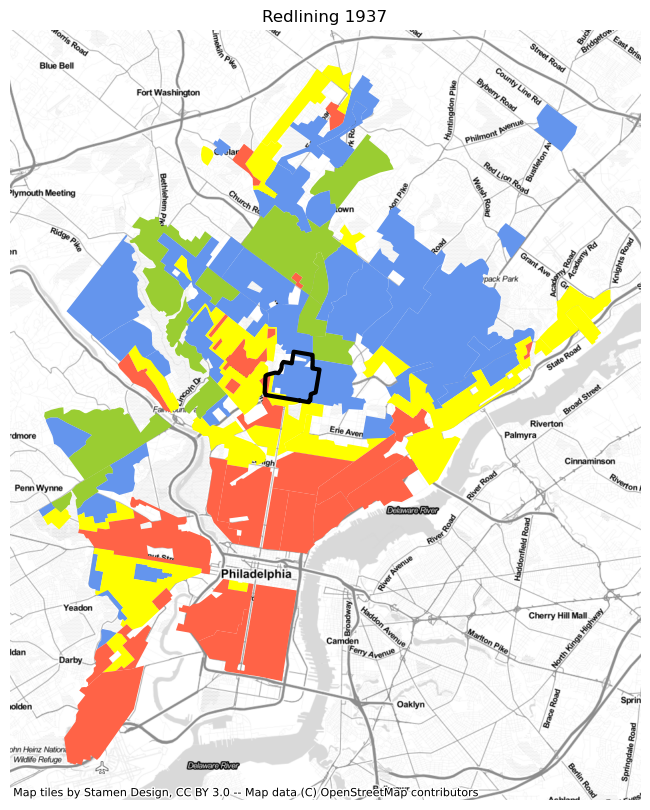

In [76]:
fig, ax = plt.subplots(figsize=(10,10))

redline.to_crs(3857).plot(ax=ax,
        marker='o',
        markersize=10,
        color = redline.color)

ax.axis('off')
ax.set_title('Redlining 1937')

logan_boundary.to_crs(3857).geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=3857)
plt.savefig("redlining1937.png", transparent=True)

This redlining map shows the Logan Neighborhood as largely deemed "still desirable" but adjacent to declining areas. Based on our background research, we know that the Logan Neighborhood in the early 1900s was a largely Jewsih Community with a street of major Jewish stores, several notable synagogues, and a Jewish hospital. Jewish neighborhoods were not graded "A" as the most desirable, which accounts for the mostly blue color. As we can see from our current racial distribution maps, the population has changed significantly since the 1930s. 

### Demolition Data ###

From our background research, we also know that housing demolitions, which there were hundreds of in Logan, can add to lead because lead paint can spread via air. For this section, I am going to map out demolition point data from OpenDataPhilly and then attempt to put a 400ft barrier around it. The 400 ft radius is the estimated safe point where air-borne lead particles. I will first read in the demolition data and take an initial look at the variables. 

In [77]:
demolitions=gpd.read_file('data/demolitions.geojson')
demolitions.head()

,objectid,addressobjectid,parcel_id_num,opa_account_num,address,unit_type,unit_num,zip,censustract,opa_owner,...,contractorcity,contractorstate,contractorzip,mostrecentinsp,systemofrecord,geocode_x,geocode_y,council_district,posse_jobid,geometry
0,49,94039,42284,884586820,1217-19 E COLUMBIA AVE,None,None,19125-3934,158,1217-19 E COLUMBIA AVE LL,...,PHILADELPHIA,PA,19133-,2019-11-22 12:44:00+00:00,HANSEN,2.702555e+06,243183.930421,None,None,POINT (-75.13061 39.97101)
1,50,298575,129817,882969235,8056-58 FRANKFORD AVE,None,None,19136-2616,331.02,RITCHIE JOSEPH,...,NEWTOWN,PA,18940-,2020-03-10 07:21:00+00:00,HANSEN,2.731070e+06,270114.361864,None,None,POINT (-75.02596 40.04254)
2,51,37212,528521,322230500,2111 W BERKS ST,None,None,19121-2126,152,FRAZIER LINDA,...,PHILADELPHIA,PA,19122-,2020-03-12 08:07:00+00:00,HANSEN,2.691669e+06,247373.497884,None,None,POINT (-75.16899 39.98338)
3,52,357781,438469,031113100,6128 IRVING ST,None,None,19139-3730,83.01,MITCHELL LYNDA L,...,PHILADELPHIA,PA,19133-,2019-10-17 12:48:00+00:00,HANSEN,2.670731e+06,237296.884444,None,None,POINT (-75.24470 39.95739)
4,53,677829,311656,782810510,1510 N 25TH ST,None,None,19121-3819,138,MILKBREW LLC,...,PHILADELPHIA,PA,19149-,2019-12-06 08:07:00+00:00,HANSEN,2.689568e+06,245621.907412,None,None,POINT (-75.17667 39.97875)


Let's make sure it's in the right projection! 

In [78]:
demolitions_repro = demolitions.to_crs(3857)


Now, I am going to add a buffer around each demolition. Because of the projection, the unit is in meters. I found that 400 feet = 121.92 meters, so that is the buffer distance I am going to make. 

In [79]:
demo_buffer = demolitions_repro.buffer(121.92,6)

Did it work?

In [80]:
demo_buffer

0        POLYGON ((-8363379.328 4861730.426, -8363383.4...
1        POLYGON ((-8351729.521 4872125.276, -8351733.6...
2        POLYGON ((-8367652.216 4863528.127, -8367656.3...
3        POLYGON ((-8376079.880 4859752.241, -8376084.0...
4        POLYGON ((-8368506.704 4862854.332, -8368510.8...
                               ...                        
12602    POLYGON ((-8368139.461 4862414.313, -8368143.6...
12603    POLYGON ((-8374194.462 4857342.496, -8374198.6...
12604    POLYGON ((-8375588.850 4859050.240, -8375593.0...
12605    POLYGON ((-8373213.849 4861268.233, -8373218.0...
12606    POLYGON ((-8355996.620 4869845.688, -8356000.7...
Length: 12607, dtype: geometry

Let's plot out these polygons and see what just an initial spread looks like. 

<AxesSubplot: >

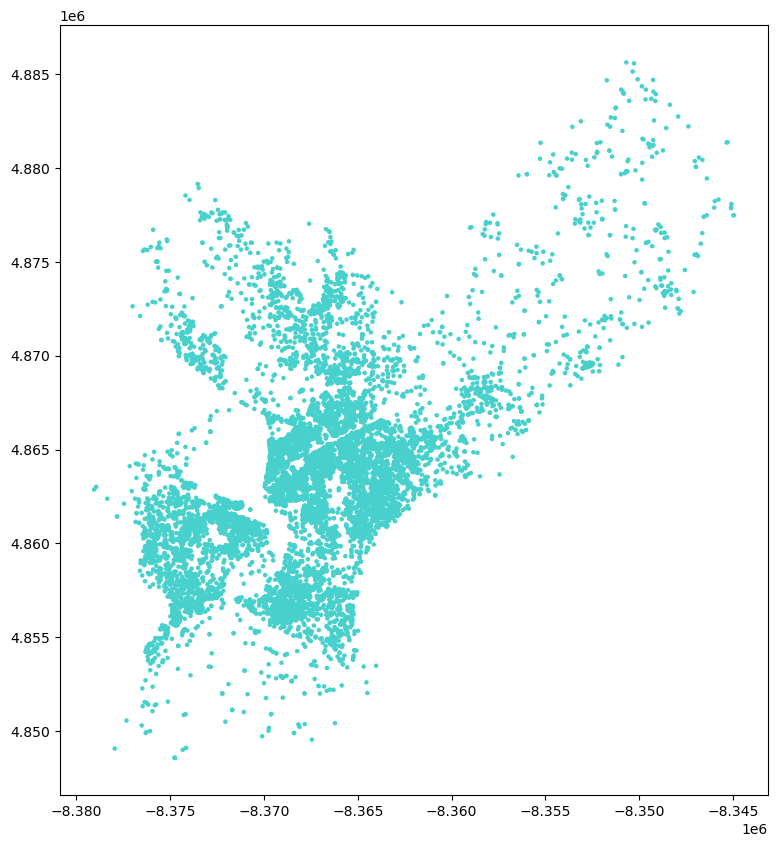

In [81]:
fig, ax = plt.subplots(figsize=(10,10))
demo_buffer.plot(ax=ax, 
    color='mediumturquoise')

Cool, it worked. Let's overlay this onto a base map of Philadelphia so it doesn't just exist in space. Let's also try to layer on the demolition sites and work with the marker sizing to try to show the buffer. 

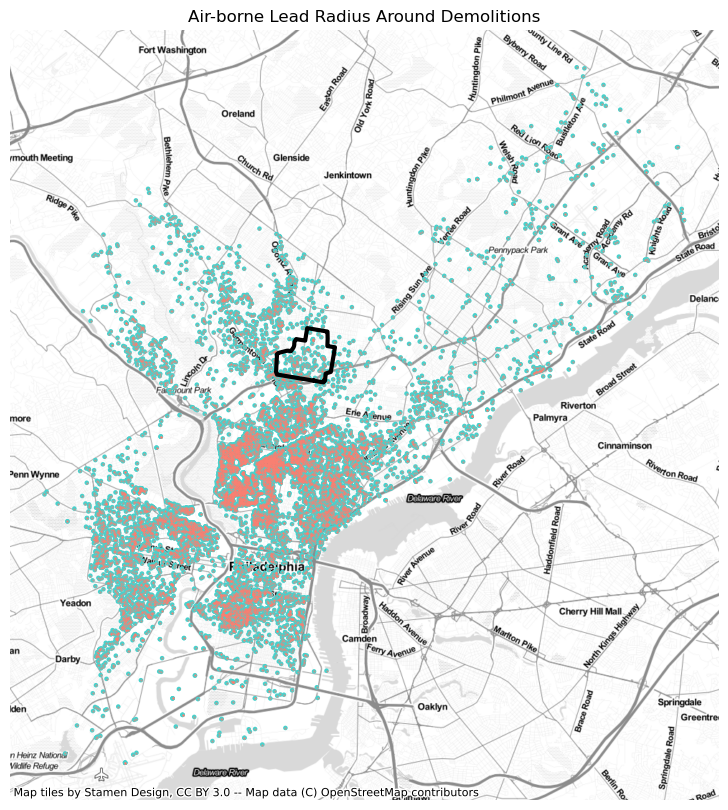

In [82]:
fig, ax = plt.subplots(figsize=(10,10))
demo_buffer.plot(ax=ax, 
    color='mediumturquoise')

demolitions_repro.plot(ax=ax, 
    marker='.',
    markersize=.5,             
    color='salmon')

ax.axis('off')
ax.set_title('Air-borne Lead Radius Around Demolitions')

logan_boundary.to_crs(3857).geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=3857)
plt.savefig("demolitions.png", transparent=True)

It worked!!! There are quite a few demolitions in the center of the City, but there are also a lot of demolitions in the Logan Neighborhood, which is largely residential. I want to make this clearer to show, so I am going to now make a custom legend. 

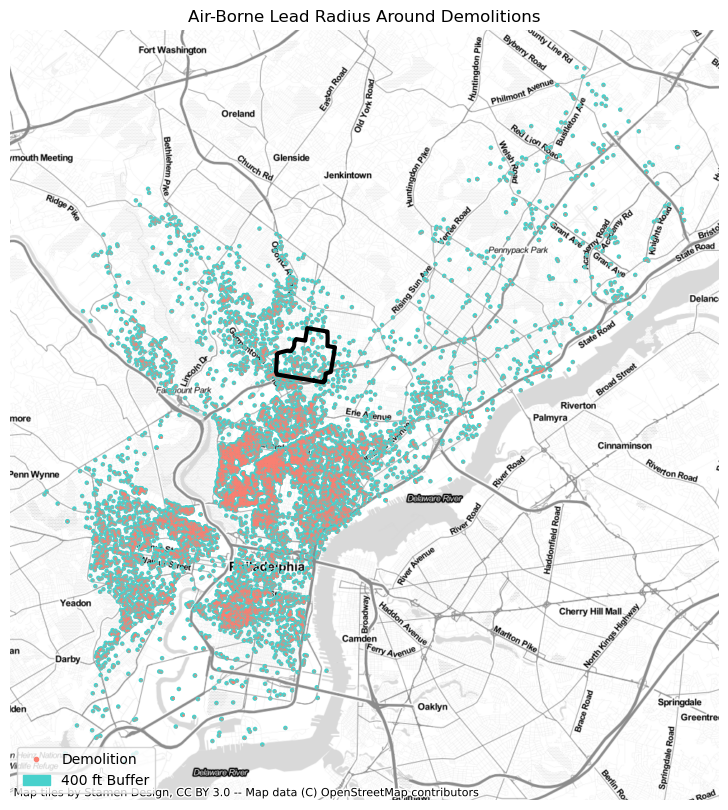

In [83]:
# set up the subplots

fig, ax = plt.subplots(figsize=(10,10))
demo_buffer.plot(ax=ax, 
    color='mediumturquoise')

demolitions_repro.plot(ax=ax, 
    marker='.',
    markersize=.5,             
    color='salmon')

logan_boundary.to_crs(3857).geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)

# build custom legend
legend_elements = [
    # add the center node to the legend
    Line2D([0], [0], marker='.', color='salmon', linestyle='',label='Demolition', markersize=6),
    ]

legend_item = Patch(facecolor='mediumturquoise', edgecolor='mediumturquoise', linestyle='-',linewidth=1,label='400 ft Buffer')
legend_elements.append(legend_item)

# add the legend
ax.legend(handles=legend_elements,loc='lower left') # location options: upper/center/lower and left/center/right

# hide the axis
ax.axis('off')
ax.set_title('Air-Borne Lead Radius Around Demolitions')

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=3857)
plt.savefig("demolitions_legend.png", transparent=True)

Cool. However, I just revisited the initial import, and I see a column with "status" included. I think I've been mapping out all completed AND planned demolitions. I wanted to get a sense of the impact of demolitions on lead (hence the 400 ft buffer), so I think what I really need is just **completed** demolitionsn. I am going to subset online completed demolitions and go through all the steps above to map out the completed. 

In [84]:
demo_complete = demolitions_repro[demolitions_repro['status']=='COMPLETED']

In [85]:
demo_complete.info

<bound method DataFrame.info of        objectid addressobjectid parcel_id_num opa_account_num  \
0            49           94039         42284       884586820   
1            50          298575        129817       882969235   
2            51           37212        528521       322230500   
3            52          357781        438469       031113100   
4            53          677829        311656       782810510   
...         ...             ...           ...             ...   
12590     11435       133009887        294052       092232300   
12592     11437       130906777        431350       882968860   
12593     11438       135499340        245197       212511600   
12594     11439       176086331        194247       161254800   
12595     11440        15812359        216325       212511700   

                      address unit_type unit_num         zip censustract  \
0      1217-19 E COLUMBIA AVE      None     None  19125-3934         158   
1       8056-58 FRANKFORD AVE      

Adding that buffer again!

In [86]:
demo_com_buffer = demo_complete.buffer(121.92,6)

Let's map out only the complete demolitions and their buffer. 

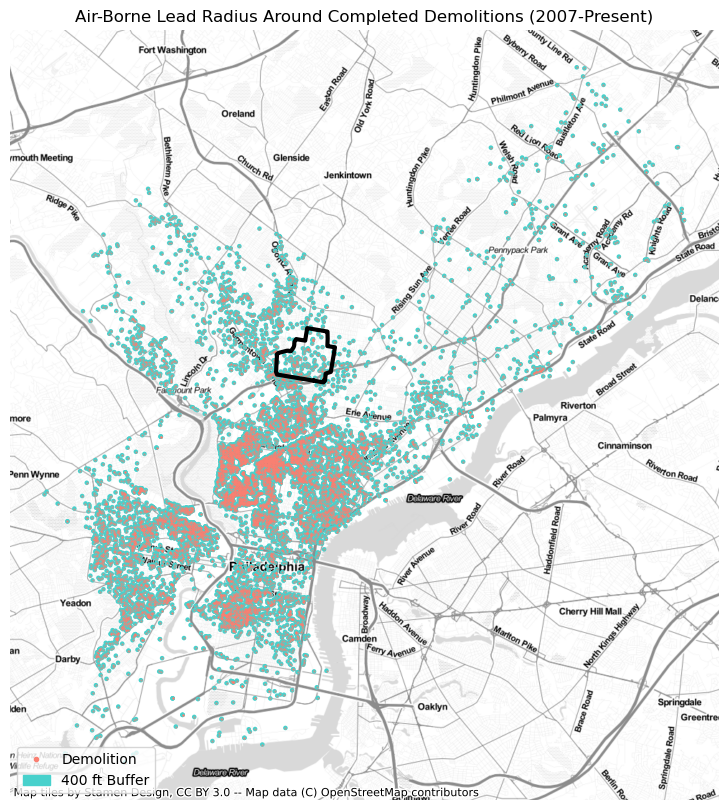

In [87]:
# set up the subplots

fig, ax = plt.subplots(figsize=(10,10))
demo_com_buffer.plot(ax=ax, 
    color='mediumturquoise')

demo_complete.plot(ax=ax, 
    marker='.',
    markersize=.5,             
    color='salmon')

logan_boundary.to_crs(3857).geometry.boundary.plot(color=None,edgecolor='black',linewidth = 3,ax=ax)

# build custom legend
legend_elements = [
    # add the center node to the legend
    Line2D([0], [0], marker='.', color='salmon', linestyle='',label='Demolition', markersize=6),
    ]

legend_item = Patch(facecolor='mediumturquoise', edgecolor='mediumturquoise', linestyle='-',linewidth=1,label='400 ft Buffer')
legend_elements.append(legend_item)

# add the legend
ax.legend(handles=legend_elements,loc='lower left') # location options: upper/center/lower and left/center/right

# hide the axis
ax.axis('off')
ax.set_title('Air-Borne Lead Radius Around Completed Demolitions (2007-Present)')

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=3857)
plt.savefig("demolitions_legend_comp.png", transparent=True)

Amazing, so the map above illustrates the same pattern. A lot of demolitions in central (and north and west philadelphia). Interestingly enough, these overlay very similar patterns to the redlining map. This might be an area for future exploration. But, let's move only the lead indicator data I found. 

### Lead Exposure Indicators ###

We also wanted to look at other factors that contribute to lead risk. We found a dataset from UCSB that included risk factors for specific parts of Philadelphia that are more likely to have lead exposure. The project "Lead Risk Factors for West and North Philadelphia for 2013 - 2020" included some of the same variables we used and did an incredible amount of cleaning on large datasets. However, they only include 5 of our 6 census tracts, and they compare to other areas of West and North Philadelphia vs. all of Philadelphia as we have been. Still, we thought it would be important to include these indices in our assessment, but acknowledging only 5 of our 6 Logan Boundary tracts are included. 





In [88]:
dflead = pd.read_csv(
    'data/leadrisk.csv',
    dtype=
    {
        'state':str,
        'county': str,
        'tract':str
    }
)

In [89]:
dflead.head()

,Unnamed: 0,tract,number_of_children_with_ebll_2015,acs_total_population_2019,acs_total_population_ages_0_5_2019,acs_housing_units_total_2019,acs_owner_occupied_units_2019,percent_owner_occupied,acs_renter_occupied_unit_2019,percent_renter_occupied,...,lead_violations_2007_2020,smelters,land_recycled_sites_2020,soil_400_ppm,all_normalized_soil,pct_no_health_ins_acs_15_19,pct_pop_disabled_acs_15_19,pct_hispanic_acs_15_19,state,county
0,1,038900,9.0,NaN,591,1413,797,56.404812,502,35.527247,...,0,0,0,0,0.0,5.51,28.02,3.72,42,101
1,2,038300,15.0,NaN,245,2476,479,19.345719,464,18.739903,...,0,0,0,0,0.0,13.37,28.29,60.23,42,101
2,3,028900,11.0,11347.0,254,3477,1887,54.270923,1406,40.437158,...,0,0,0,0,0.0,NaN,NaN,NaN,NaN,NaN
3,4,028800,24.0,4890.0,250,1536,800,52.083333,614,39.973958,...,0,0,0,0,0.0,13.10,25.53,62.16,42,101
4,5,028700,8.0,2782.0,438,875,343,39.200000,469,53.600000,...,0,0,3,0,0.0,12.26,24.29,61.47,42,101


Similar to other indicator administrative data, we will need to merge these statistics onto the map using FIPS codes. So, I am going to make the FIPS variable using the existing disparate geographic identifiers. Then I will use the head function to check it out. 

In [90]:
dflead['FIPS'] ='42' + '101' + dflead['tract']


In [91]:
dflead['FIPS'].head()

0    42101038900
1    42101038300
2    42101028900
3    42101028800
4    42101028700
Name: FIPS, dtype: object

It worked! So, let's now merge that tracts geojson onto the lead variables, recognizing that it is still just 5/6 tracts. 

In [92]:
pa_lead= tracts.merge(dflead,on='FIPS')

In [93]:
logan_lead = pa_lead[pa_lead['FIPS'].isin(logan_FIPS)]

logan_boundary_lead = logan_lead.dissolve()

In [94]:
logan_lead.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 5 entries, 35 to 70
Data columns (total 37 columns):
 #   Column                                      Non-Null Count  Dtype   
---  ------                                      --------------  -----   
 0   TRACTCE10                                   5 non-null      object  
 1   geometry                                    5 non-null      geometry
 2   FIPS                                        5 non-null      object  
 3   Unnamed: 0                                  5 non-null      int64   
 4   tract                                       5 non-null      object  
 5   number_of_children_with_ebll_2015           5 non-null      float64 
 6   acs_total_population_2019                   5 non-null      float64 
 7   acs_total_population_ages_0_5_2019          5 non-null      int64   
 8   acs_housing_units_total_2019                5 non-null      int64   
 9   acs_owner_occupied_units_2019               5 non-null      int64   
 

In [95]:
logan_lead = logan_lead[['TRACTCE10','FIPS','geometry','demolitions_2007_2020','number_demolitions_by_violation_2007_2020','total_housing_code_violations_2007_2020','critical_housing_code_violations_2007_2020','lead_violations_2007_2020','smelters','land_recycled_sites_2020','soil_400_ppm','all_normalized_soil']]


In [96]:
logan_lead.head()

,TRACTCE10,FIPS,geometry,demolitions_2007_2020,number_demolitions_by_violation_2007_2020,total_housing_code_violations_2007_2020,critical_housing_code_violations_2007_2020,lead_violations_2007_2020,smelters,land_recycled_sites_2020,soil_400_ppm,all_normalized_soil
35,028300,42101028300,"POLYGON ((-75.14169 40.02076, -75.14159 40.020...",27,22,8462,48,0,0,0,0,0.0
36,028400,42101028400,"POLYGON ((-75.13571 40.02392, -75.13555 40.026...",27,23,4641,38,0,0,0,0,0.0
68,028000,42101028000,"POLYGON ((-75.15385 40.02217, -75.15336 40.022...",33,25,5145,73,0,0,0,0,0.0
69,028100,42101028100,"POLYGON ((-75.14658 40.03065, -75.14652 40.030...",17,13,3748,87,0,0,0,2,282.0
70,028200,42101028200,"POLYGON ((-75.13507 40.03129, -75.13497 40.032...",23,6,3820,33,2,0,0,0,0.0


In [97]:
pa_lead = pa_lead[['TRACTCE10','FIPS','geometry','demolitions_2007_2020','number_demolitions_by_violation_2007_2020','total_housing_code_violations_2007_2020','critical_housing_code_violations_2007_2020','lead_violations_2007_2020','smelters','land_recycled_sites_2020','soil_400_ppm','all_normalized_soil']]


In [98]:
pa_lead.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 72 entries, 0 to 71
Data columns (total 12 columns):
 #   Column                                      Non-Null Count  Dtype   
---  ------                                      --------------  -----   
 0   TRACTCE10                                   72 non-null     object  
 1   FIPS                                        72 non-null     object  
 2   geometry                                    72 non-null     geometry
 3   demolitions_2007_2020                       72 non-null     int64   
 4   number_demolitions_by_violation_2007_2020   72 non-null     int64   
 5   total_housing_code_violations_2007_2020     72 non-null     int64   
 6   critical_housing_code_violations_2007_2020  72 non-null     int64   
 7   lead_violations_2007_2020                   72 non-null     int64   
 8   smelters                                    72 non-null     int64   
 9   land_recycled_sites_2020                    72 non-null     int64   
 

In [99]:
pa_lead['total_housing_code_violations_2007_2020']

0     9074
1     5074
2     8435
3     4542
4     3518
      ... 
67    4074
68    5145
69    3748
70    3820
71    4026
Name: total_housing_code_violations_2007_2020, Length: 72, dtype: int64

In [100]:
logan_lead['total_housing_code_violations_2007_2020']

35    8462
36    4641
68    5145
69    3748
70    3820
Name: total_housing_code_violations_2007_2020, dtype: int64

In [101]:
pa_lead_sorted =pa_lead.sort_values(by=['total_housing_code_violations_2007_2020'], ascending=False)
pa_lead_sorted


,TRACTCE10,FIPS,geometry,demolitions_2007_2020,number_demolitions_by_violation_2007_2020,total_housing_code_violations_2007_2020,critical_housing_code_violations_2007_2020,lead_violations_2007_2020,smelters,land_recycled_sites_2020,soil_400_ppm,all_normalized_soil
61,016701,42101016701,"POLYGON ((-75.16340 39.98722, -75.16318 39.987...",207,189,17883,325,0,0,0,0,0.000000
42,015101,42101015101,"POLYGON ((-75.18672 39.99022, -75.18706 39.988...",100,78,13291,240,0,0,0,0,0.000000
40,020101,42101020101,"POLYGON ((-75.15548 39.99877, -75.15523 39.998...",88,66,12605,175,4,0,0,0,0.000000
24,016902,42101016902,"POLYGON ((-75.18600 39.99013, -75.18590 39.990...",230,209,12369,0,1,0,0,0,0.000000
6,015200,42101015200,"POLYGON ((-75.17226 39.98999, -75.17236 39.990...",155,141,11241,174,0,1,0,1,62.666667
...,...,...,...,...,...,...,...,...,...,...,...,...
51,023600,42101023600,"POLYGON ((-75.19800 40.03948, -75.19613 40.037...",14,1,644,0,0,0,0,0,0.000000
64,027000,42101027000,"POLYGON ((-75.13294 40.04607, -75.13212 40.046...",4,1,612,2,0,0,0,0,0.000000
53,023900,42101023900,"POLYGON ((-75.18823 40.03119, -75.18821 40.031...",3,0,409,1,0,0,0,6,161.142857
50,023500,42101023500,"POLYGON ((-75.20275 40.04351, -75.20298 40.043...",9,0,373,4,0,0,0,0,0.000000


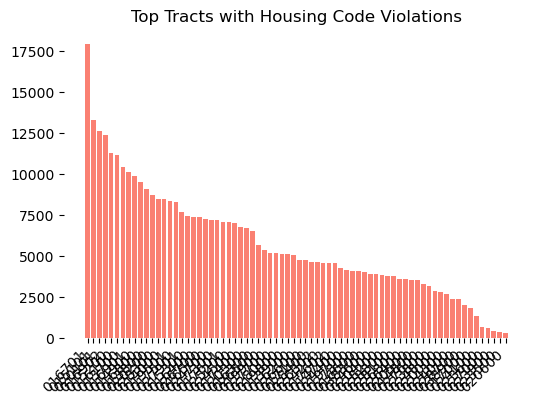

In [102]:
fig, ax = plt.subplots(figsize=(6,4))

for spine in plt.gca().spines.values():
    spine.set_visible(False)



plt.bar('TRACTCE10', 'total_housing_code_violations_2007_2020', data=pa_lead.sort_values(by=['total_housing_code_violations_2007_2020'], ascending=False) , color='salmon')

                                     
                                  #   .plot.sort(ascending=0).bar(ax=ax,
                                   #   x='FIPS',
                                     # y='total_housing_code_violations_2007_2020',
                                     # legend=False,
                                     # color='#1a4280ff',
                                      # )
plt.xticks(rotation=45, ha='right')


#ax.set_ylabel('Number of Housing Code Violations 2007-2020') # override y label
plt.title("Top Tracts with Housing Code Violations"); # multi-line title with padding

total_housingviolate= pa_lead.value_counts('total_housing_code_violations_2007_2020')
total_housingviolate

In [103]:
pa_lead.sort_values(by=['total_housing_code_violations_2007_2020'], ascending=False)

,TRACTCE10,FIPS,geometry,demolitions_2007_2020,number_demolitions_by_violation_2007_2020,total_housing_code_violations_2007_2020,critical_housing_code_violations_2007_2020,lead_violations_2007_2020,smelters,land_recycled_sites_2020,soil_400_ppm,all_normalized_soil
61,016701,42101016701,"POLYGON ((-75.16340 39.98722, -75.16318 39.987...",207,189,17883,325,0,0,0,0,0.000000
42,015101,42101015101,"POLYGON ((-75.18672 39.99022, -75.18706 39.988...",100,78,13291,240,0,0,0,0,0.000000
40,020101,42101020101,"POLYGON ((-75.15548 39.99877, -75.15523 39.998...",88,66,12605,175,4,0,0,0,0.000000
24,016902,42101016902,"POLYGON ((-75.18600 39.99013, -75.18590 39.990...",230,209,12369,0,1,0,0,0,0.000000
6,015200,42101015200,"POLYGON ((-75.17226 39.98999, -75.17236 39.990...",155,141,11241,174,0,1,0,1,62.666667
...,...,...,...,...,...,...,...,...,...,...,...,...
51,023600,42101023600,"POLYGON ((-75.19800 40.03948, -75.19613 40.037...",14,1,644,0,0,0,0,0,0.000000
64,027000,42101027000,"POLYGON ((-75.13294 40.04607, -75.13212 40.046...",4,1,612,2,0,0,0,0,0.000000
53,023900,42101023900,"POLYGON ((-75.18823 40.03119, -75.18821 40.031...",3,0,409,1,0,0,0,6,161.142857
50,023500,42101023500,"POLYGON ((-75.20275 40.04351, -75.20298 40.043...",9,0,373,4,0,0,0,0,0.000000


In [104]:
pa_lead_20 = pa_lead.sort_values(by=['total_housing_code_violations_2007_2020'], ascending=False).head(20)

print (pa_lead_20)


   TRACTCE10         FIPS                                           geometry  \
61    016701  42101016701  POLYGON ((-75.16340 39.98722, -75.16318 39.987...   
42    015101  42101015101  POLYGON ((-75.18672 39.99022, -75.18706 39.988...   
40    020101  42101020101  POLYGON ((-75.15548 39.99877, -75.15523 39.998...   
24    016902  42101016902  POLYGON ((-75.18600 39.99013, -75.18590 39.990...   
6     015200  42101015200  POLYGON ((-75.17226 39.98999, -75.17236 39.990...   
17    016100  42101016100  POLYGON ((-75.12242 39.98701, -75.12292 39.987...   
44    013700  42101013700  POLYGON ((-75.18898 39.97982, -75.18906 39.979...   
25    016901  42101016901  POLYGON ((-75.17117 39.99417, -75.17112 39.994...   
5     014900  42101014900  POLYGON ((-75.18786 39.98112, -75.18701 39.981...   
23    016800  42101016800  POLYGON ((-75.17226 39.98999, -75.17214 39.989...   
0     013800  42101013800  POLYGON ((-75.17341 39.97779, -75.17386 39.977...   
12    020200  42101020200  POLYGON ((-75

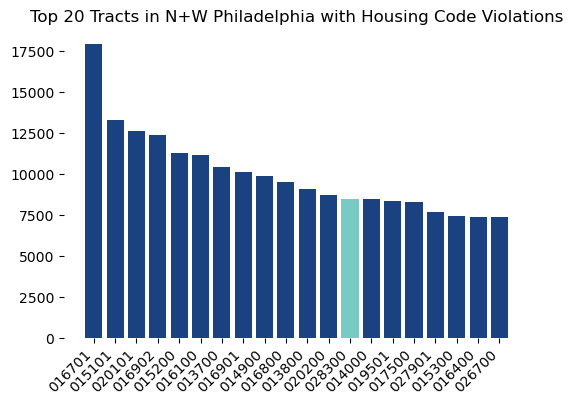

In [105]:
fig, ax = plt.subplots(figsize=(6,4))

for spine in plt.gca().spines.values():
    spine.set_visible(False)


    
#pa_lead_sorted =pa_lead[:10].sort_values(by=['critical_housing_code_violations_2007_2020'], ascending=False)
plt.bar('TRACTCE10', 'total_housing_code_violations_2007_2020', data=pa_lead_20, color='#1a4280ff')
bars = ax.patches
bars[12].set_fc('#78cac3ff')


                                     
                                  #   .plot.sort(ascending=0).bar(ax=ax,
                                   #   x='FIPS',
                                     # y='total_housing_code_violations_2007_2020',
                                     # legend=False,
                                     # color='#1a4280ff',
                                      # )
plt.xticks(rotation=45, ha='right')


#ax.set_ylabel('Number of Housing Code Violations 2007-2020') # override y label
plt.title("Top 20 Tracts in N+W Philadelphia with Housing Code Violations"); # multi-line title with padding
plt.savefig("Housing Code Violations in Philadelphia since 2007.png", transparent=True)
